In [4]:
import pandas as pd
import numpy as np

# data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# machine learning
from sklearn.preprocessing import StandardScaler

import sklearn.linear_model as skl_lm
from sklearn import preprocessing
from sklearn import neighbors
from sklearn.metrics import confusion_matrix, classification_report, precision_score
from sklearn.model_selection import train_test_split


import statsmodels.api as sm
import statsmodels.formula.api as smf

In [5]:
df = pd.read_csv('/content/wine.csv')

In [6]:
df.head(3)

,label,Alcohol,Malic acid,Ash,Alcalinity of ash,Magnesium,Total phenols,Flavanoids,Nonflavanoid phenols,Proanthocyanins,Color intensity,Hue,OD280/OD315 of diluted wines,Proline
0,1,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,1,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185


In [7]:
df.corr()

,label,Alcohol,Malic acid,Ash,Alcalinity of ash,Magnesium,Total phenols,Flavanoids,Nonflavanoid phenols,Proanthocyanins,Color intensity,Hue,OD280/OD315 of diluted wines,Proline
label,1.000000,-0.328222,0.437776,-0.049643,0.517859,-0.209179,-0.719163,-0.847498,0.489109,-0.499130,0.265668,-0.617369,-0.788230,-0.633717
Alcohol,-0.328222,1.000000,0.094397,0.211545,-0.310235,0.270798,0.289101,0.236815,-0.155929,0.136698,0.546364,-0.071747,0.072343,0.643720
Malic acid,0.437776,0.094397,1.000000,0.164045,0.288500,-0.054575,-0.335167,-0.411007,0.292977,-0.220746,0.248985,-0.561296,-0.368710,-0.192011
Ash,-0.049643,0.211545,0.164045,1.000000,0.443367,0.286587,0.128980,0.115077,0.186230,0.009652,0.258887,-0.074667,0.003911,0.223626
Alcalinity of ash,0.517859,-0.310235,0.288500,0.443367,1.000000,-0.083333,-0.321113,-0.351370,0.361922,-0.197327,0.018732,-0.273955,-0.276769,-0.440597
Magnesium,-0.209179,0.270798,-0.054575,0.286587,-0.083333,1.000000,0.214401,0.195784,-0.256294,0.236441,0.199950,0.055398,0.066004,0.393351
Total phenols,-0.719163,0.289101,-0.335167,0.128980,-0.321113,0.214401,1.000000,0.864564,-0.449935,0.612413,-0.055136,0.433681,0.699949,0.498115
Flavanoids,-0.847498,0.236815,-0.411007,0.115077,-0.351370,0.195784,0.864564,1.000000,-0.537900,0.652692,-0.172379,0.543479,0.787194,0.494193
Nonflavanoid phenols,0.489109,-0.155929,0.292977,0.186230,0.361922,-0.256294,-0.449935,-0.537900,1.000000,-0.365845,0.139057,-0.262640,-0.503270,-0.311385
Proanthocyanins,-0.499130,0.136698,-0.220746,0.009652,-0.197327,0.236441,0.612413,0.652692,-0.365845,1.000000,-0.025250,0.295544,0.519067,0.330417


<Axes: title={'center': 'Pearson Correlation Heatmap'}>

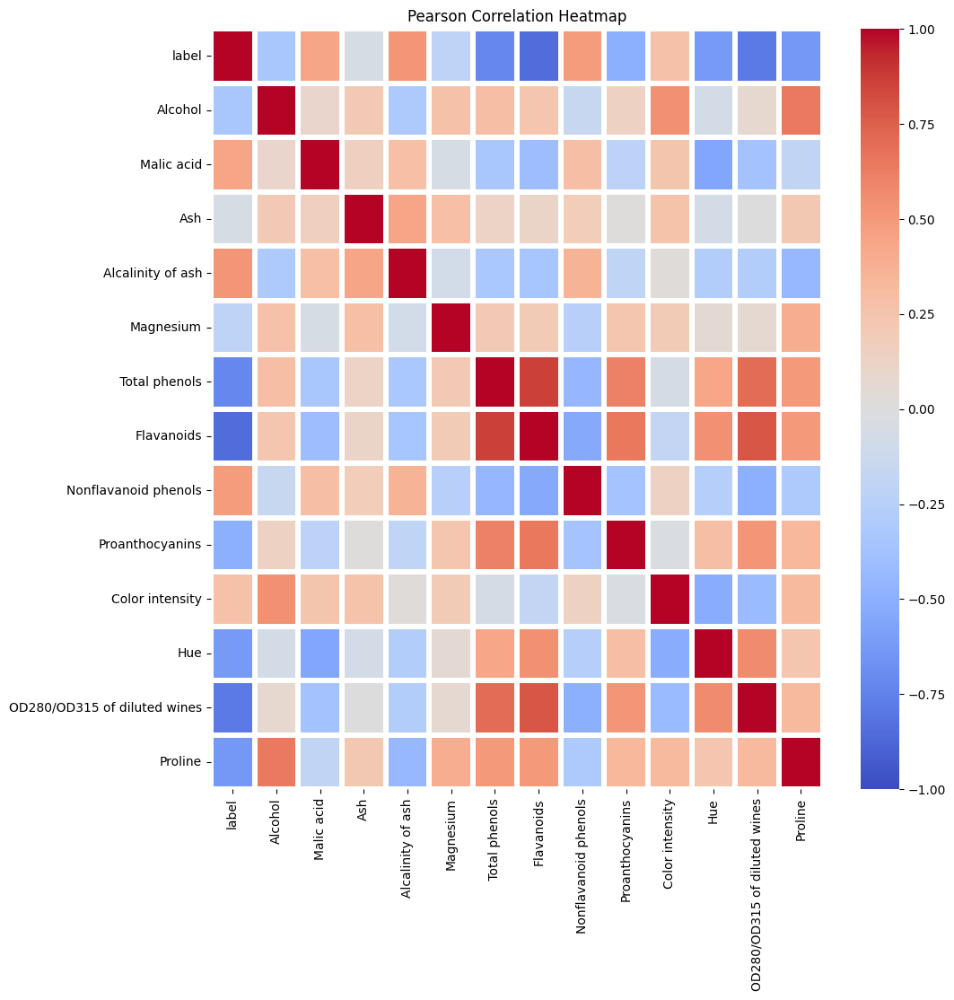

In [8]:
plt.figure(figsize=(11,11))
plt.title("Pearson Correlation Heatmap")
corr = df.corr(method='pearson')
mask = np.tril(df.corr())
sns.heatmap(corr,
           xticklabels=corr.columns.values,
           yticklabels=corr.columns.values,
           annot = False, # to show the correlation degree on cell
           vmin=-1,
           vmax=1,
           center= 0,
           fmt='0.2g', #
           cmap= 'coolwarm',
           linewidths=3, # cells partioning line width
           linecolor='white', # for spacing line color between cells
           square=False,#to make cells square
           cbar_kws= {'orientation': 'vertical'}
           )

In [9]:
corr_label = corr['label'].sort_values()

In [10]:
corr_label

Flavanoids                     -0.847498
OD280/OD315 of diluted wines   -0.788230
 Total phenols                 -0.719163
Proline                        -0.633717
Hue                            -0.617369
Proanthocyanins                -0.499130
Alcohol                        -0.328222
Magnesium                      -0.209179
Ash                            -0.049643
Color intensity                 0.265668
Malic acid                      0.437776
Nonflavanoid phenols            0.489109
Alcalinity of ash               0.517859
label                           1.000000
Name: label, dtype: float64

In [11]:
min_corr = ['label', 'Flavanoids', 'OD280/OD315 of diluted wines', ' Total phenols']

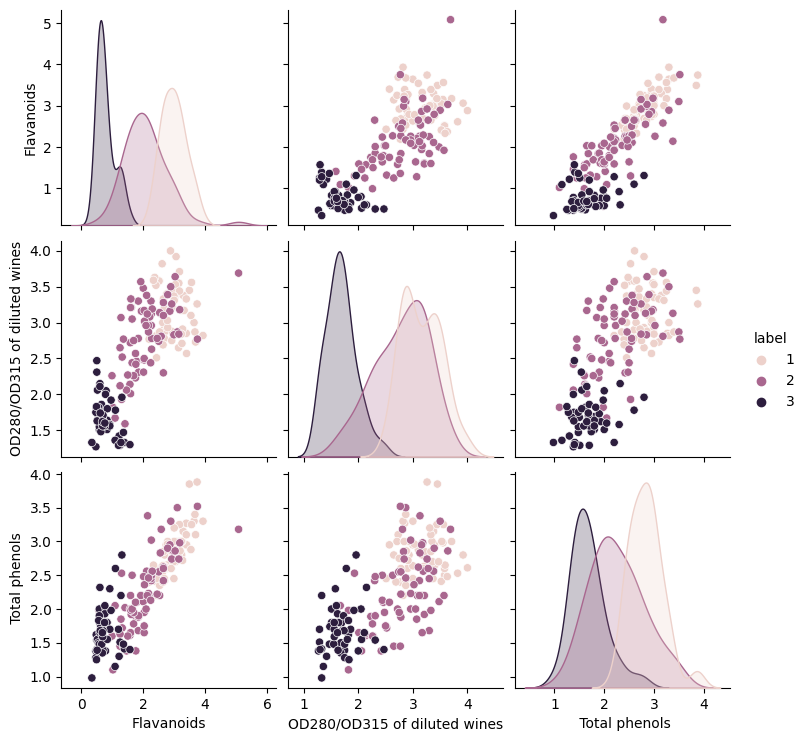

In [12]:
sns.pairplot(df[min_corr], hue="label")

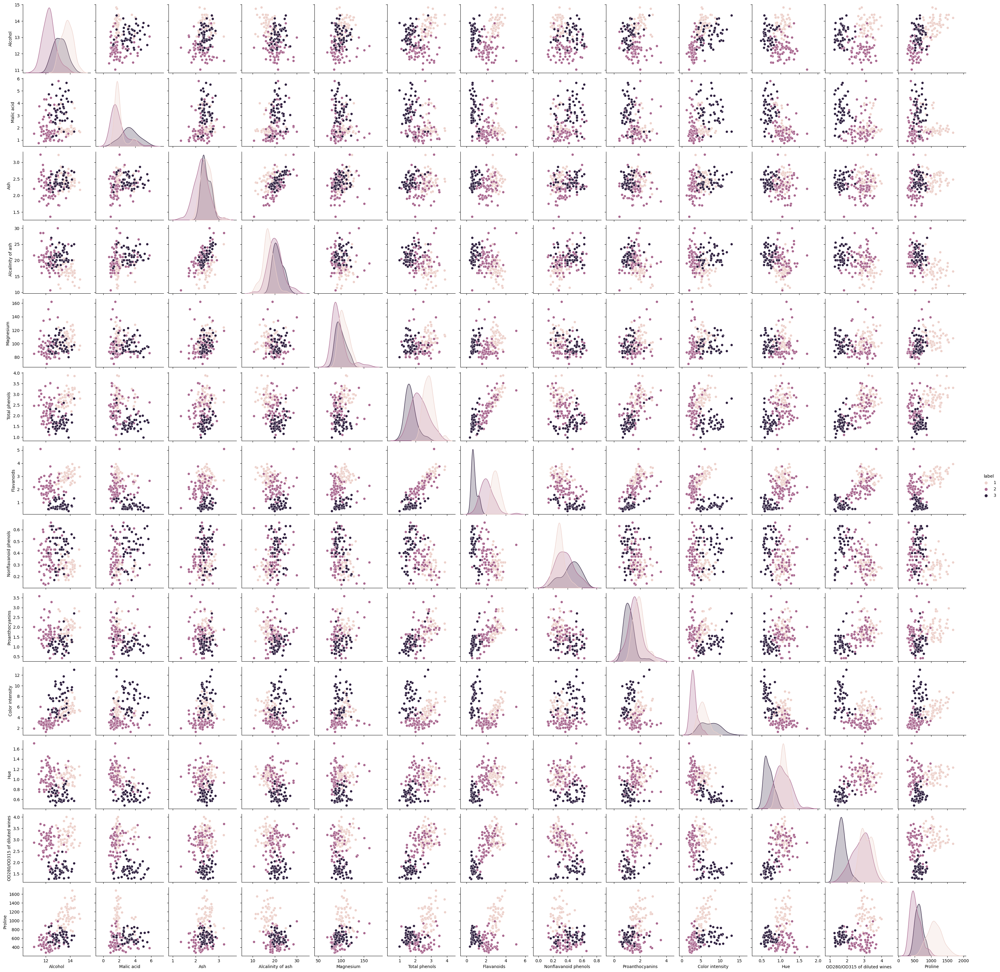

In [13]:
sns.pairplot(df[df.columns], hue="label")

In [14]:
df['label']==3


0      False
1      False
2      False
3      False
4      False
       ...  
173     True
174     True
175     True
176     True
177     True
Name: label, Length: 178, dtype: bool

In [15]:
new_label = []
for i in range(df.shape[0]):
    if df['label'].iloc[i] == 3:
        new_label.append(3)
    else:
        new_label.append(0)


In [16]:
df['new_label'] = new_label

In [17]:
df.head(3)

,label,Alcohol,Malic acid,Ash,Alcalinity of ash,Magnesium,Total phenols,Flavanoids,Nonflavanoid phenols,Proanthocyanins,Color intensity,Hue,OD280/OD315 of diluted wines,Proline,new_label
0,1,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065,0
1,1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050,0
2,1,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185,0


<Axes: title={'center': 'Pearson Correlation Heatmap'}>

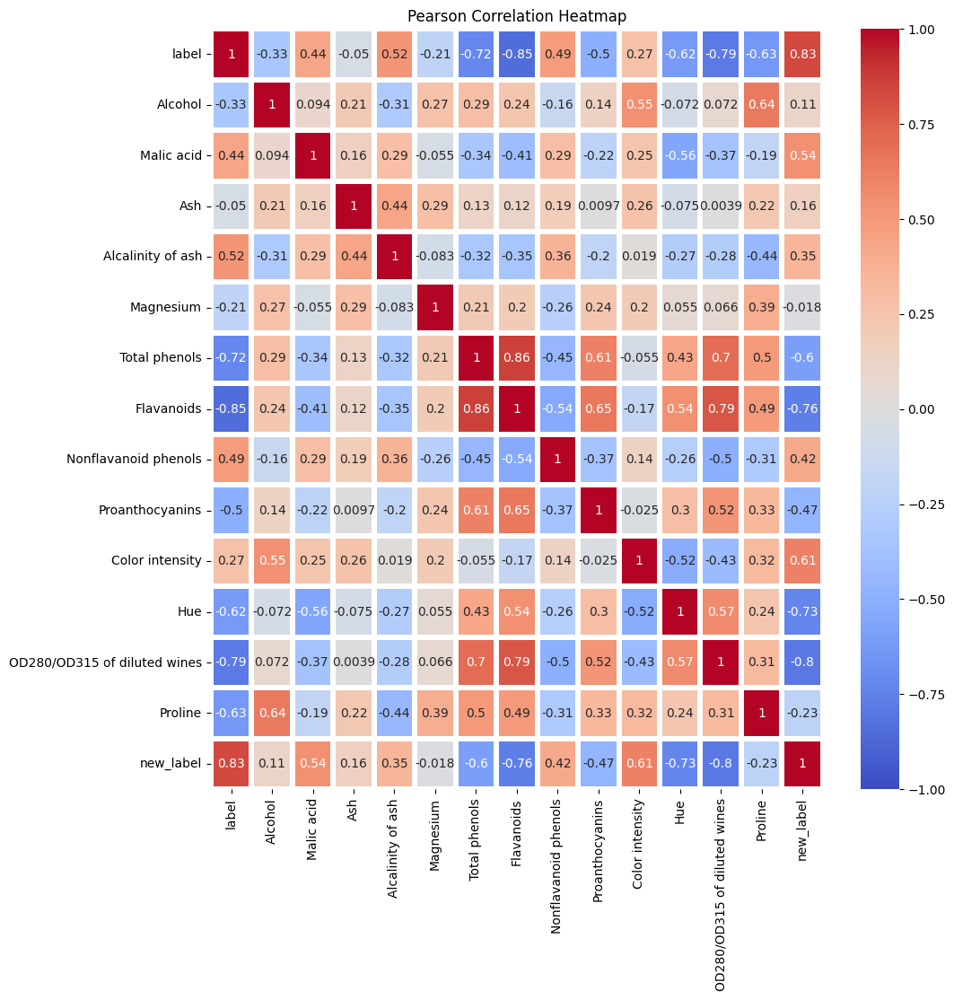

In [18]:
plt.figure(figsize=(11,11))
plt.title("Pearson Correlation Heatmap")
corr = df.corr(method='pearson')
mask = np.tril(df.corr())
sns.heatmap(corr,
           xticklabels=corr.columns.values,
           yticklabels=corr.columns.values,
           annot = True, # to show the correlation degree on cell
           vmin=-1,
           vmax=1,
           center= 0,
           fmt='0.2g', #
           cmap= 'coolwarm',
           linewidths=3, # cells partioning line width
           linecolor='white', # for spacing line color between cells
           square=False,#to make cells square
           cbar_kws= {'orientation': 'vertical'}
           )

In [19]:
corr['new_label'].sort_values()

OD280/OD315 of diluted wines   -0.796590
Flavanoids                     -0.761232
Hue                            -0.732443
 Total phenols                 -0.600119
Proanthocyanins                -0.465629
Proline                        -0.226394
Magnesium                      -0.018306
Alcohol                         0.114941
Ash                             0.156738
Alcalinity of ash               0.350650
Nonflavanoid phenols            0.419347
Malic acid                      0.544042
Color intensity                 0.614582
label                           0.834820
new_label                       1.000000
Name: new_label, dtype: float64

In [20]:
corr_new_label = ['OD280/OD315 of diluted wines', 'Flavanoids', 'Hue', ' Total phenols', 'Color intensity']

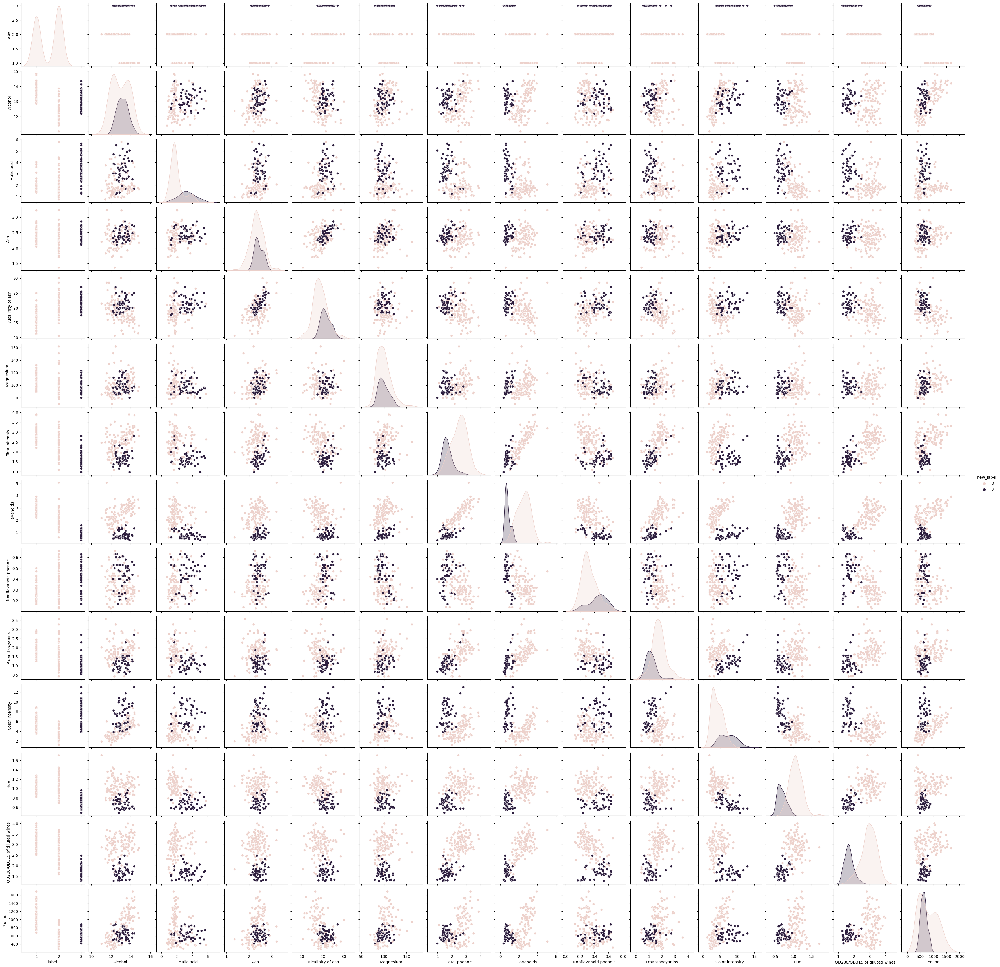

In [21]:
sns.pairplot(df[df.columns], hue="new_label")

<Axes: >

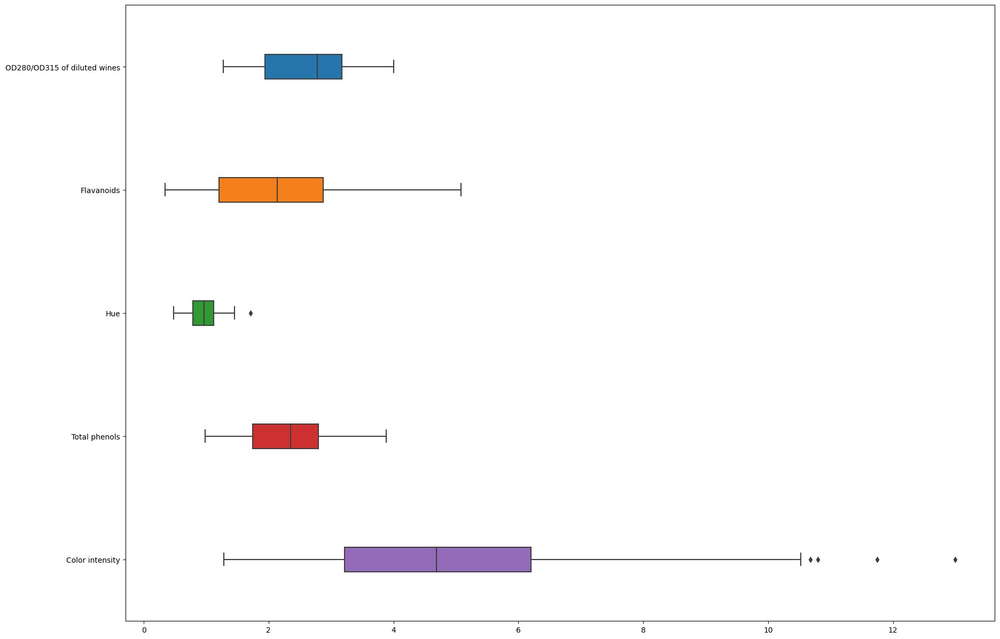

In [22]:
plt.figure(figsize=(21,15))
sns.boxplot(data= df[corr_new_label],
                                   orient='h',
                                   width=0.2,
                                   saturation=0.9)

<ipython-input-23-8fd5af62e40b>:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[str(c)])
<ipython-input-23-8fd5af62e40b>:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[str(c)])
<ipython-input-23-8fd5af62e40b>:3: UserWarning: 

`distplot` is a deprecated function and will be removed in s

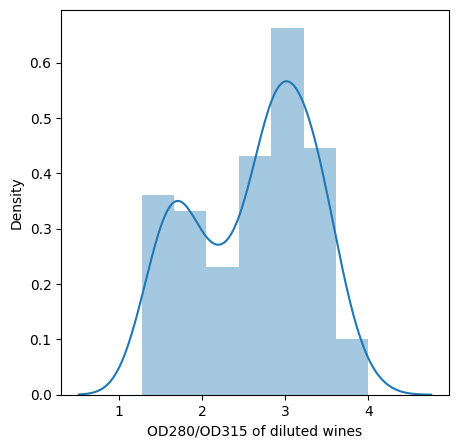

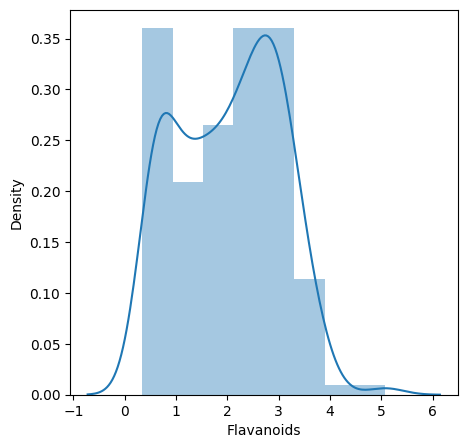

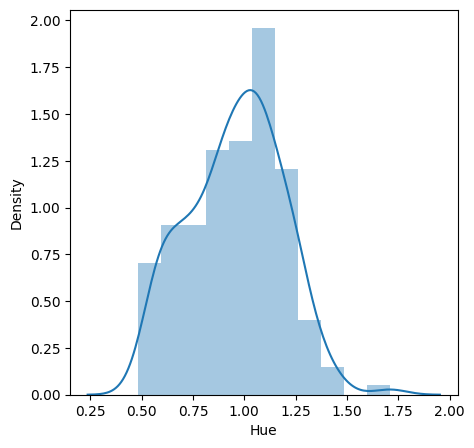

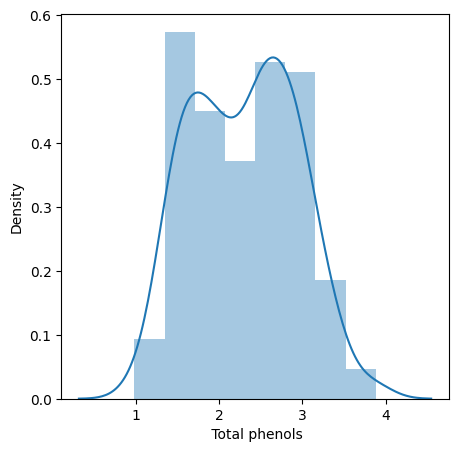

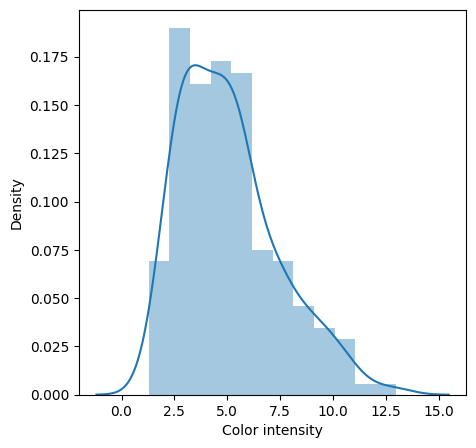

In [23]:
for c in corr_new_label:
  plt.figure(figsize=(5,5))
  sns.distplot(df[str(c)])

### **Model**

In [24]:
from sklearn.datasets import load_iris
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

In [25]:
df[corr_new_label]

,OD280/OD315 of diluted wines,Flavanoids,Hue,Total phenols,Color intensity
0,3.92,3.06,1.04,2.80,5.64
1,3.40,2.76,1.05,2.65,4.38
2,3.17,3.24,1.03,2.80,5.68
3,3.45,3.49,0.86,3.85,7.80
4,2.93,2.69,1.04,2.80,4.32
...,...,...,...,...,...
173,1.74,0.61,0.64,1.68,7.70
174,1.56,0.75,0.70,1.80,7.30
175,1.56,0.69,0.59,1.59,10.20
176,1.62,0.68,0.60,1.65,9.30


In [26]:
X_train, X_test, y_train, y_test = train_test_split(df[corr_new_label], df['new_label'], test_size=0.4, random_state=40)

In [27]:
clf = LogisticRegression(random_state=0).fit(X_train, y_train)


In [28]:
predictions = clf.predict(X_test)

In [29]:
predictions

array([0, 0, 0, 3, 3, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 3, 3, 0, 0, 0, 3, 0,
       0, 0, 3, 3, 0, 3, 3, 0, 0, 0, 3, 0, 3, 3, 0, 0, 0, 0, 3, 3, 3, 3,
       0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0])

In [30]:
y_test

127    0
5      0
52     0
145    3
162    3
      ..
39     0
113    0
9      0
2      0
118    0
Name: new_label, Length: 72, dtype: int64

In [31]:
import math
def sig(x):
 return 1/(1 + math.exp(-x))

In [32]:
prediction_p = []
for val in predictions:
  prediction_p.append(sig(val))

In [33]:
from sklearn.metrics import log_loss
logloss = log_loss(y_test, prediction_p)


In [34]:
logloss

0.5320072233133945

## `Seprating 1 and 2`

In [35]:
df1 = df.drop([i for i in range(130, 178)])

In [36]:
df1 = df1.iloc[:,:-1]

In [37]:
df1.corr()

,label,Alcohol,Malic acid,Ash,Alcalinity of ash,Magnesium,Total phenols,Flavanoids,Nonflavanoid phenols,Proanthocyanins,Color intensity,Hue,OD280/OD315 of diluted wines,Proline
label,1.000000,-0.824399,-0.044302,-0.354548,0.470437,-0.383085,-0.532692,-0.610730,0.337489,-0.249205,-0.750613,-0.017043,-0.391746,-0.845296
Alcohol,-0.824399,1.000000,0.021014,0.190818,-0.461771,0.330544,0.485061,0.543729,-0.301314,0.190869,0.741935,0.026162,0.290491,0.756168
Malic acid,-0.044302,0.021014,1.000000,0.121625,0.141753,-0.016360,0.030038,0.057852,0.055669,0.136454,-0.108202,-0.408645,0.166457,-0.107553
Ash,-0.354548,0.190818,0.121625,1.000000,0.369136,0.306593,0.254490,0.377025,0.179396,0.077778,0.253347,0.041164,0.214496,0.304101
Alcalinity of ash,0.470437,-0.461771,0.141753,0.369136,1.000000,-0.123546,-0.228873,-0.180189,0.335042,-0.096965,-0.433335,-0.035805,-0.000632,-0.427021
Magnesium,-0.383085,0.330544,-0.016360,0.306593,-0.123546,1.000000,0.304089,0.255309,-0.212922,0.278018,0.345495,0.071684,0.130838,0.426982
Total phenols,-0.532692,0.485061,0.030038,0.254490,-0.228873,0.304089,1.000000,0.846509,-0.444721,0.444117,0.590428,-0.008302,0.494673,0.506179
Flavanoids,-0.610730,0.543729,0.057852,0.377025,-0.180189,0.255309,0.846509,1.000000,-0.358804,0.542889,0.707064,-0.006622,0.537528,0.545781
Nonflavanoid phenols,0.337489,-0.301314,0.055669,0.179396,0.335042,-0.212922,-0.444721,-0.358804,1.000000,-0.337243,-0.280354,0.051340,-0.468611,-0.330049
Proanthocyanins,-0.249205,0.190869,0.136454,0.077778,-0.096965,0.278018,0.444117,0.542889,-0.337243,1.000000,0.272754,-0.010739,0.342529,0.274927


<Axes: title={'center': 'Pearson Correlation Heatmap'}>

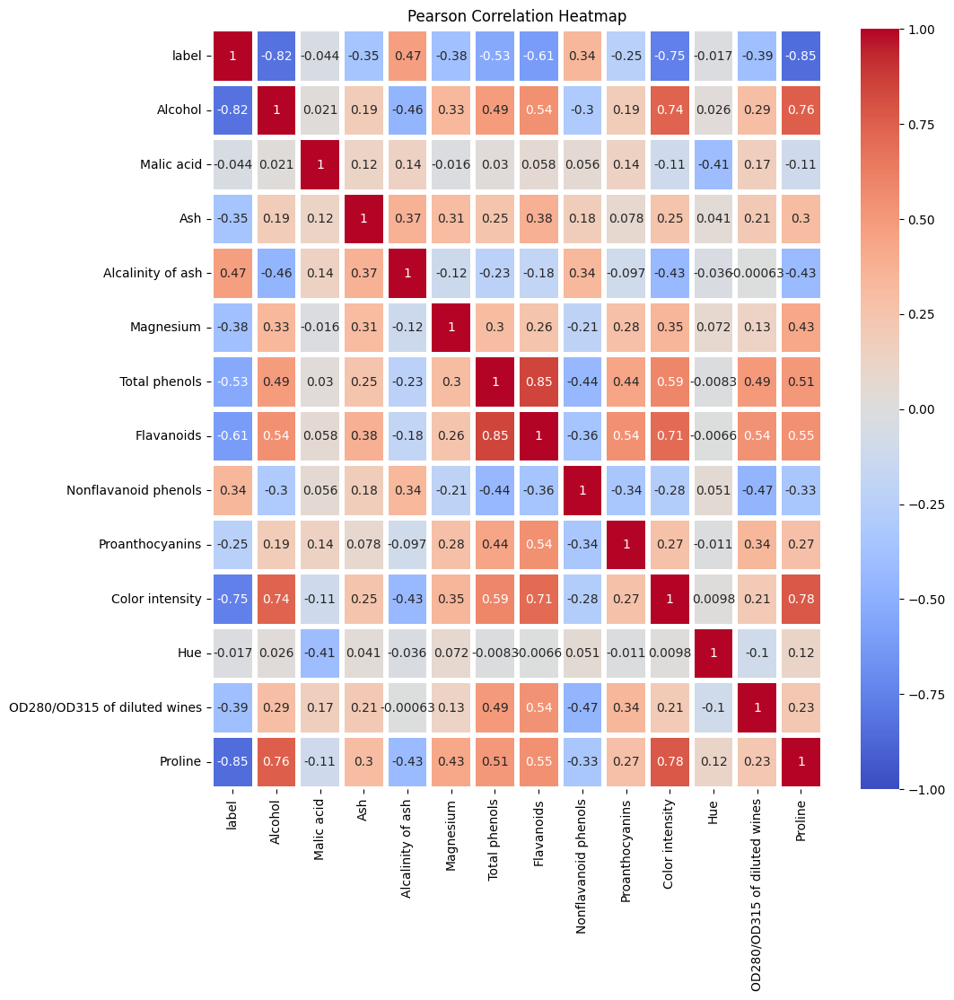

In [38]:
plt.figure(figsize=(11,11))
plt.title("Pearson Correlation Heatmap")
corr = df1.corr(method='pearson')
mask = np.tril(df.corr())
sns.heatmap(corr,
           xticklabels=corr.columns.values,
           yticklabels=corr.columns.values,
           annot = True, # to show the correlation degree on cell
           vmin=-1,
           vmax=1,
           center= 0,
           fmt='0.2g', #
           cmap= 'coolwarm',
           linewidths=3, # cells partioning line width
           linecolor='white', # for spacing line color between cells
           square=False,#to make cells square
           cbar_kws= {'orientation': 'vertical'}
           )

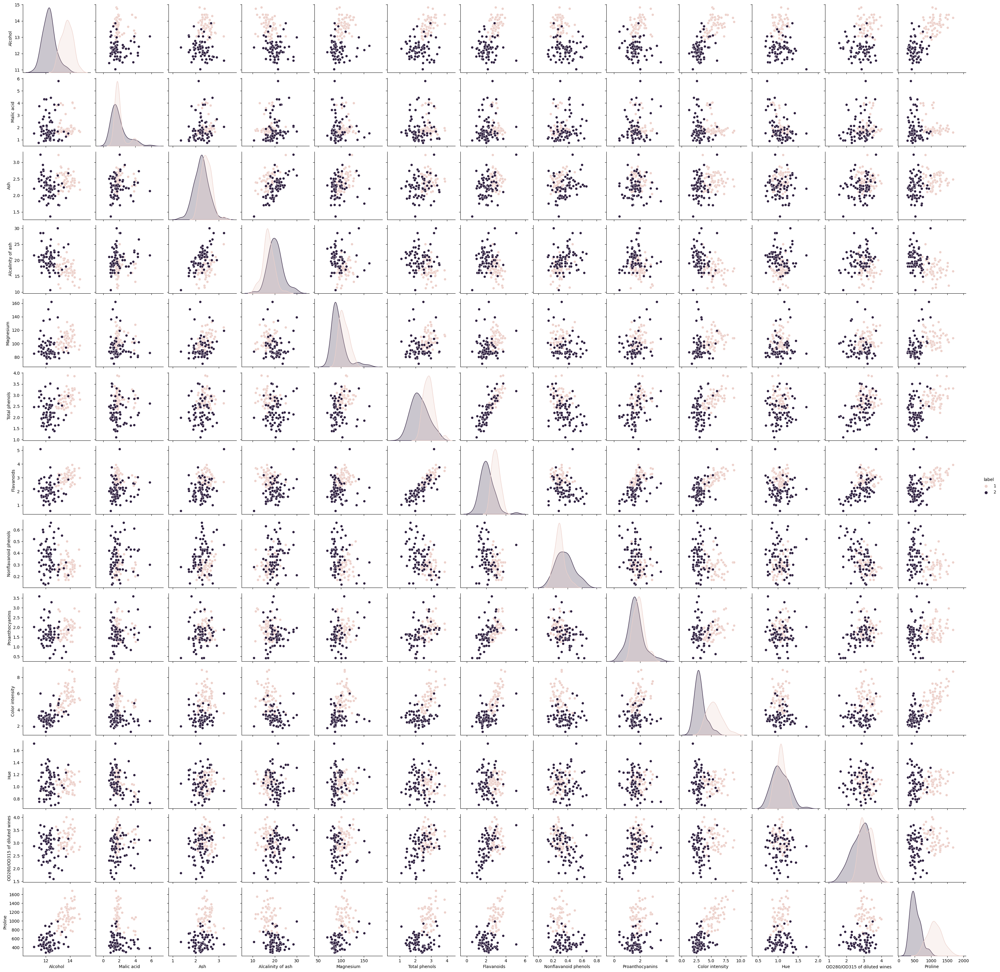

In [39]:
sns.pairplot(df1[df1.columns], hue="label")

In [40]:
df1.corr()['label'].sort_values()

Proline                        -0.845296
Alcohol                        -0.824399
Color intensity                -0.750613
Flavanoids                     -0.610730
 Total phenols                 -0.532692
OD280/OD315 of diluted wines   -0.391746
Magnesium                      -0.383085
Ash                            -0.354548
Proanthocyanins                -0.249205
Malic acid                     -0.044302
Hue                            -0.017043
Nonflavanoid phenols            0.337489
Alcalinity of ash               0.470437
label                           1.000000
Name: label, dtype: float64

In [41]:
col_df1 = ['Proline', 'Alcohol', 'Color intensity', 'label']

In [42]:
col_df11 = ['Alcohol', 'Color intensity', 'label']

<Axes: >

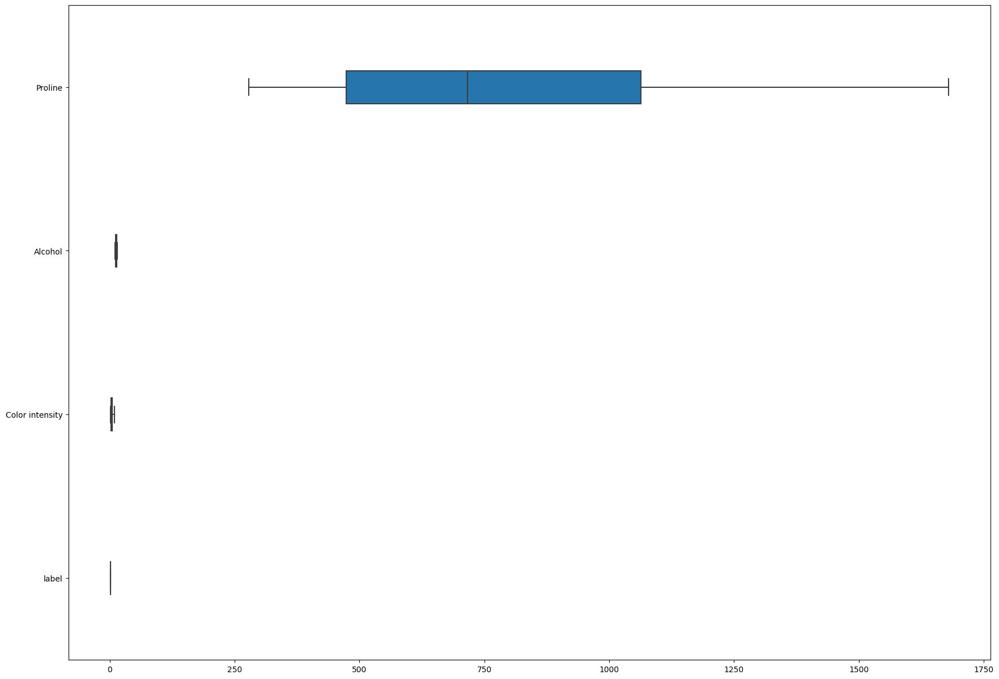

In [43]:
plt.figure(figsize=(21,15))
sns.boxplot(data= df1[col_df1],
                                   orient='h',
                                   width=0.2,
                                   saturation=0.9)

<Axes: >

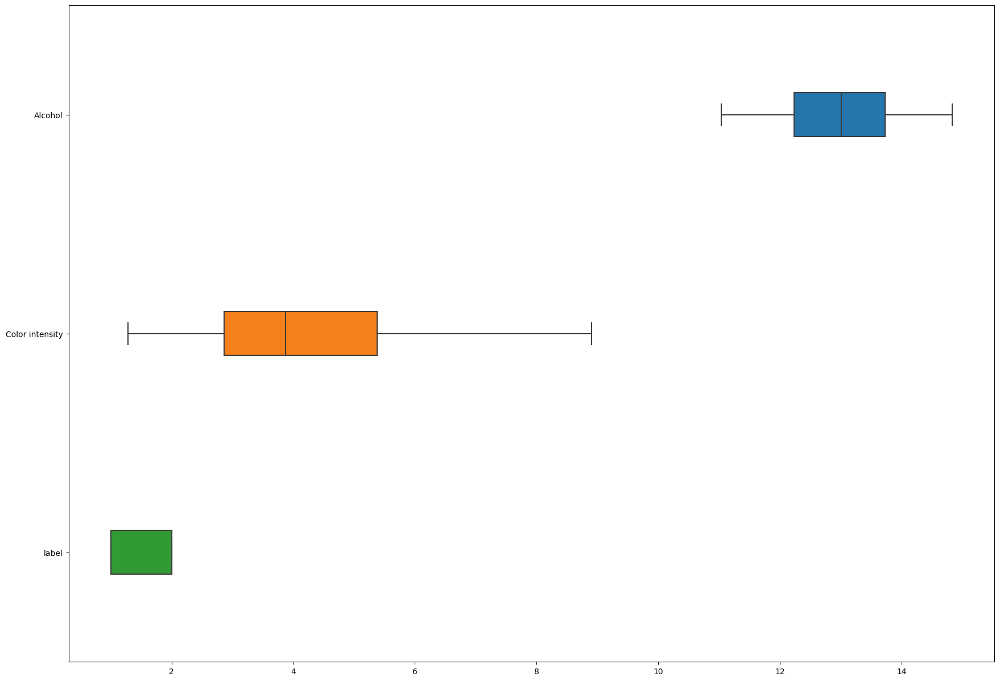

In [44]:
plt.figure(figsize=(21,15))
sns.boxplot(data= df1[col_df11],
                                   orient='h',
                                   width=0.2,
                                   saturation=0.9)

<ipython-input-45-2ed6632cf947>:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df1[str(c)])
<ipython-input-45-2ed6632cf947>:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df1[str(c)])
<ipython-input-45-2ed6632cf947>:3: UserWarning: 

`distplot` is a deprecated function and will be removed in

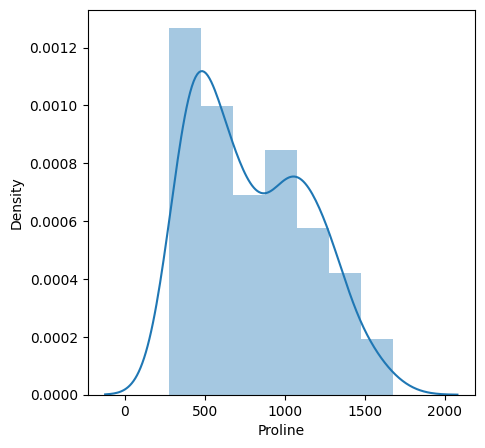

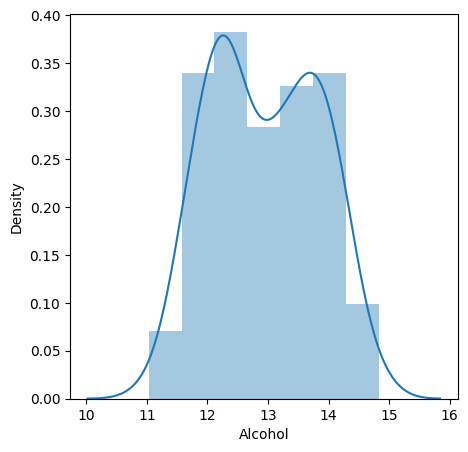

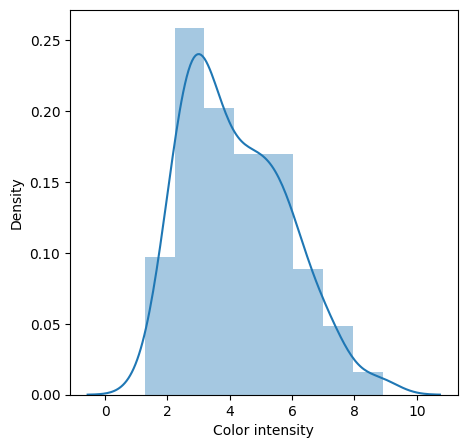

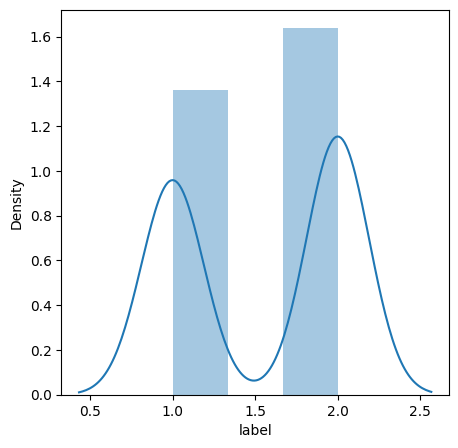

In [45]:
for c in col_df1:
  plt.figure(figsize=(5,5))
  sns.distplot(df1[str(c)])

In [46]:
col_df1[:-1]

['Proline', 'Alcohol', 'Color intensity']

In [47]:
X_train1, X_test1, y_train1, y_test1 = train_test_split(df1[col_df1[:-1]], df1['label'], test_size=0.4, random_state=40)

### **Logestic Regression**

In [48]:
clf1 = LogisticRegression(random_state=0).fit(X_train1, y_train1)


In [49]:
predictions1 = clf1.predict(X_test1)

In [50]:
predictions1

array([1, 1, 2, 1, 2, 2, 2, 2, 1, 2, 2, 1, 2, 1, 1, 2, 1, 2, 1, 2, 2, 1,
       2, 2, 1, 2, 1, 1, 1, 1, 1, 2, 2, 2, 2, 1, 2, 1, 2, 2, 2, 1, 2, 2,
       1, 2, 2, 1, 2, 2, 1, 1])

In [51]:
y_test1

48     1
40     1
64     2
42     1
87     2
84     2
107    2
81     2
15     1
80     2
93     2
6      1
94     2
17     1
54     1
98     2
39     1
66     2
51     1
108    2
100    2
47     1
88     2
89     2
11     1
69     2
24     1
16     1
2      1
23     1
45     1
90     2
75     2
4      1
119    2
10     1
126    2
29     1
78     2
110    2
85     2
38     1
76     2
95     2
32     1
97     2
86     2
21     1
68     2
61     2
9      1
26     1
Name: label, dtype: int64

In [52]:
prediction_p1 = []
for val in predictions1:
  prediction_p1.append(sig(val))

In [53]:
logloss1 = log_loss(y_test1, prediction_p1)


In [54]:
logloss1

0.6901140602531792

### **Decision Tree**

In [55]:
from sklearn.tree import DecisionTreeClassifier
clf_tree = DecisionTreeClassifier()
clf_tree = clf_tree.fit(X_train,y_train)
predictions_tree = clf_tree.predict(X_test)
predictions_tree

array([0, 0, 0, 3, 3, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 3, 3, 0, 0, 0, 3, 0,
       0, 0, 3, 3, 0, 3, 3, 0, 0, 0, 3, 0, 3, 3, 0, 0, 0, 0, 3, 3, 3, 3,
       0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0])

In [56]:
from sklearn.metrics import recall_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score

print('Precision: %.3f' % precision_score(y_test, predictions_tree))
print('Recall: %.3f' % recall_score(y_test, predictions_tree))
print('Accuracy: %.3f' % accuracy_score(y_test, predictions_tree))
print('F1 Score: %.3f' % f1_score(y_test, predictions_tree))

ValueError: ignored

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score

# Assuming you have true labels and predicted probabilities
true_labels = y_test
predicted_probabilities = predictions_tree

# Calculate false positive rate, true positive rate, and thresholds
fpr, tpr, thresholds = roc_curve(true_labels, predicted_probabilities)

# Calculate the area under the ROC curve (AUC)
auc = roc_auc_score(true_labels, predicted_probabilities)

# Plot the ROC curve
plt.plot(fpr, tpr, label='ROC Curve (AUC = %.3f)' % auc)
plt.plot([0, 1], [0, 1], '--', color='gray', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()

### **SVC**

In [ ]:
from sklearn.svm import SVC
clf_svc = SVC()
clf_svc = clf_svc.fit(X_train,y_train)
predictions_svc = clf_svc.predict(X_test)
predictions_svc

In [ ]:
print('Precision: %.3f' % precision_score(y_test, predictions_svc))
print('Recall: %.3f' % recall_score(y_test, predictions_svc))
print('Accuracy: %.3f' % accuracy_score(y_test, predictions_svc))
print('F1 Score: %.3f' % f1_score(y_test, predictions_svc))

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score

# Assuming you have true labels and predicted probabilities
true_labels = y_test
predicted_probabilities_svc = predictions_svc

# Calculate false positive rate, true positive rate, and thresholds
fpr_svc, tpr_svc, thresholds = roc_curve(true_labels, predicted_probabilities_svc)

# Calculate the area under the ROC curve (AUC)
auc = roc_auc_score(true_labels, predicted_probabilities_svc)

# Plot the ROC curve
plt.plot(fpr_svc, tpr_svc, label='ROC Curve (AUC = %.3f)' % auc)
plt.plot([0, 1], [0, 1], '--', color='gray', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()

### **Naive Bayes**

In [ ]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
gnb = gnb.fit(X_train,y_train)
predictions_gnb = gnb.predict(X_test)
predictions_gnb

In [ ]:
print('Precision: %.3f' % precision_score(y_test, predictions_gnb))
print('Recall: %.3f' % recall_score(y_test, predictions_gnb))
print('Accuracy: %.3f' % accuracy_score(y_test, predictions_gnb))
print('F1 Score: %.3f' % f1_score(y_test, predictions_gnb))

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score

# Assuming you have true labels and predicted probabilities
true_labels = y_test
predicted_probabilities_gnb = predictions_gnb

# Calculate false positive rate, true positive rate, and thresholds
fpr_gnb, tpr_gnb, thresholds = roc_curve(true_labels, predictions_gnb)

# Calculate the area under the ROC curve (AUC)
auc = roc_auc_score(true_labels, predictions_gnb)

# Plot the ROC curve
plt.plot(fpr_gnb, tpr_gnb, label='ROC Curve (AUC = %.3f)' % auc)
plt.plot([0, 1], [0, 1], '--', color='gray', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()